In [1]:
import os
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.visualization import (ZScaleInterval, ImageNormalize)
import tensorflow as tf
from tensorflow import keras

In [2]:
!pip freeze

absl-py==0.11.0
anaconda==0.0.1.1
anyio==2.2.0
argon2-cffi==20.1.0
astropy==4.1
astroquery==0.4.1
astunparse==1.6.3
async-generator==1.10
attrs==20.3.0
Babel==2.9.1
backcall==0.2.0
beautifulsoup4==4.9.3
bleach==3.2.1
cachetools==4.2.0
certifi==2020.12.5
cffi==1.14.4
chardet==4.0.0
cryptography==2.9.2
cycler==0.10.0
decorator==4.4.2
defusedxml==0.6.0
deprecation==2.1.0
entrypoints==0.3
esutil==0.6.5
fitsio==1.1.2
flatbuffers==1.12
gast==0.3.3
google-auth==1.24.0
google-auth-oauthlib==0.4.2
google-pasta==0.2.0
grpcio==1.32.0
h5py==2.10.0
html5lib==1.1
idna==2.10
imageio==2.9.0
ipykernel==5.4.2
ipython==7.19.0
ipython-genutils==0.2.0
ipywidgets==7.6.2
jedi==0.18.0
jeepney==0.6.0
Jinja2==2.11.2
joblib==1.0.0
json5==0.9.5
jsonschema==3.2.0
jupyter==1.0.0
jupyter-client==6.1.7
jupyter-console==6.2.0
jupyter-core==4.7.0
jupyter-packaging==0.9.2
jupyter-server==1.6.4
jupyterlab==3.0.14
jupyterlab-pygments==0.1.2
jupyterlab-server==2.5.0
jupyterlab-widgets==1.0.0
jupyterlmod==2.0.2
Keras-Prepro

In [4]:
print(np.__version__)

1.18.4


In [2]:
cutout_dir = os.path.expandvars("$SCRATCH") + "/"
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"

In [3]:
os.listdir(cutout_dir)

['.ipynb_checkpoints',
 'labelled_cutouts_alt.h5',
 'treed',
 'cutouts_filtered.h5',
 'stronglens']

In [4]:
hf = h5py.File(cutout_dir + "cutouts_filtered.h5", "r")

# Look at sample cutouts

In [5]:
print(hf.keys())

<KeysViewHDF5 ['180.272', '181.271', '181.272', '182.270', '182.271', '182.272', '183.269', '183.270', '183.271', '184.269', '184.270', '185.268', '185.269', '185.270', '186.267', '186.268', '186.269', '186.270', '187.267', '187.268']>


In [6]:
group = hf.get("180.272/IMAGES")
plot_cutouts = np.array(group.get("c0"))
print(plot_cutouts.shape)

(128, 128, 5)


In [7]:
group_weight = hf.get("180.272/WEIGHTS")
plot_weights = np.array(group_weight.get("c0"))
print(plot_weights.shape)

(128, 128, 5)


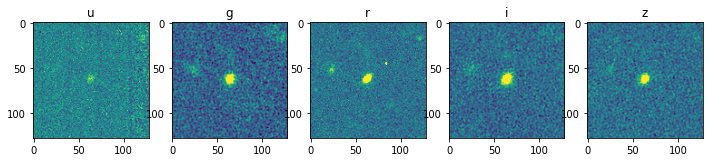

In [8]:
channels = ["u", "g", "r", "i", "z"]
fig, axes = plt.subplots(1,5, figsize=(12,8))
for i in range(5):
    norm = ImageNormalize(plot_cutouts[:,:,i], interval=ZScaleInterval())
    axes[i].imshow(plot_cutouts[:,:,i], norm=norm)
    axes[i].set_title(channels[i])

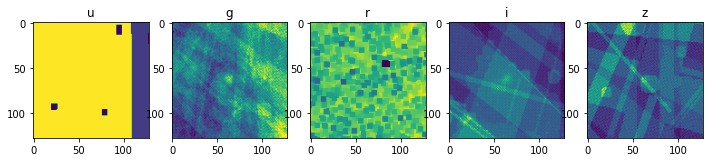

In [9]:
channels = ["u", "g", "r", "i", "z"]
fig, axes = plt.subplots(1,5, figsize=(12,8))
for i in range(5):
    norm = ImageNormalize(plot_weights[:,:,i], interval=ZScaleInterval())
    axes[i].imshow(plot_weights[:,:,i], norm=norm)
    axes[i].set_title(channels[i])

In [10]:
plot_cutouts[:,:,1].shape

(128, 128)

# Get tile ids

In [10]:
tile_list = open(image_dir + "tiles.list", "r")
for tile in tile_list.readlines():
    print(tile[:-1])
tile_list.close()

CFIS.134.283.r
CFIS.135.283.r
CFIS.136.282.r
CFIS.136.283.r
CFIS.137.282.r
CFIS.137.283.r
CFIS.138.281.r
CFIS.138.282.r
CFIS.138.283.r
CFIS.139.281.r
CFIS.139.282.r
CFIS.139.283.r
CFIS.140.280.r
CFIS.140.281.r
CFIS.140.282.r
CFIS.140.283.r
CFIS.141.280.r
CFIS.141.281.r
CFIS.141.282.r
CFIS.141.283.r
CFIS.142.279.r
CFIS.142.280.r
CFIS.142.281.r
CFIS.142.282.r
CFIS.142.283.r
CFIS.143.278.r
CFIS.143.279.r
CFIS.143.280.r
CFIS.143.281.r
CFIS.143.282.r
CFIS.143.283.r
CFIS.144.278.r
CFIS.144.279.r
CFIS.144.280.r
CFIS.144.281.r
CFIS.144.282.r
CFIS.144.283.r
CFIS.145.277.r
CFIS.145.278.r
CFIS.145.279.r
CFIS.145.280.r
CFIS.145.281.r
CFIS.145.282.r
CFIS.145.283.r
CFIS.146.277.r
CFIS.146.278.r
CFIS.146.279.r
CFIS.146.280.r
CFIS.146.281.r
CFIS.146.282.r
CFIS.146.283.r
CFIS.147.276.r
CFIS.147.277.r
CFIS.147.278.r
CFIS.147.279.r
CFIS.147.280.r
CFIS.147.281.r
CFIS.147.282.r
CFIS.147.283.r
CFIS.148.276.u CFIS.148.276.r
CFIS.148.277.r
CFIS.148.278.r
CFIS.148.279.r
CFIS.148.280.r
CFIS.148.281.r
CFIS.148.2

CFIS.234.240.u CFIS.234.240.r
CFIS.234.241.u CFIS.234.241.r
CFIS.234.242.u CFIS.234.242.r
CFIS.234.243.u CFIS.234.243.r
CFIS.234.244.u CFIS.234.244.r
CFIS.234.245.u CFIS.234.245.r
CFIS.234.246.u CFIS.234.246.r
CFIS.234.247.u CFIS.234.247.r
CFIS.234.248.u CFIS.234.248.r
CFIS.234.249.u CFIS.234.249.r
CFIS.234.250.u CFIS.234.250.r
CFIS.234.251.u CFIS.234.251.r
CFIS.234.252.u CFIS.234.252.r
CFIS.234.253.u CFIS.234.253.r
CFIS.234.254.u CFIS.234.254.r
CFIS.234.255.u CFIS.234.255.r
CFIS.234.256.u CFIS.234.256.r
CFIS.234.257.u CFIS.234.257.r
CFIS.234.258.u CFIS.234.258.r
CFIS.234.259.u CFIS.234.259.r
CFIS.234.260.u CFIS.234.260.r
CFIS.234.261.u CFIS.234.261.r
CFIS.234.262.u CFIS.234.262.r
CFIS.234.263.u CFIS.234.263.r
CFIS.234.264.u CFIS.234.264.r
CFIS.234.265.u CFIS.234.265.r
CFIS.234.266.u CFIS.234.266.r
CFIS.234.267.u
CFIS.234.268.u CFIS.234.268.r
CFIS.234.269.u CFIS.234.269.r
CFIS.234.270.r
CFIS.234.271.u CFIS.234.271.r
CFIS.234.272.u CFIS.234.272.r
CFIS.234.273.u CFIS.234.273.r
CFIS.234.2

CFIS.322.222.u
CFIS.322.223.u
CFIS.322.224.u
CFIS.322.225.u
CFIS.322.226.u
CFIS.322.227.u
CFIS.322.228.u
CFIS.322.229.u
CFIS.322.230.u
CFIS.322.231.u
CFIS.322.232.u
CFIS.322.233.u
CFIS.322.234.u
CFIS.322.235.u
CFIS.322.236.u
CFIS.322.237.u
CFIS.322.238.u CFIS.322.238.r
CFIS.322.239.u CFIS.322.239.r
CFIS.322.240.u CFIS.322.240.r
CFIS.322.241.u CFIS.322.241.r
CFIS.322.242.u CFIS.322.242.r
CFIS.322.243.u CFIS.322.243.r
CFIS.322.244.u CFIS.322.244.r
CFIS.322.245.u CFIS.322.245.r
CFIS.322.246.u CFIS.322.246.r
CFIS.322.247.u CFIS.322.247.r
CFIS.322.248.u CFIS.322.248.r
CFIS.323.218.u
CFIS.323.219.u
CFIS.323.220.u
CFIS.323.221.u
CFIS.323.222.u
CFIS.323.223.u
CFIS.323.224.u
CFIS.323.225.u
CFIS.323.226.u
CFIS.323.227.u
CFIS.323.228.u
CFIS.323.229.u
CFIS.323.230.u
CFIS.323.231.u
CFIS.323.232.u
CFIS.323.233.u
CFIS.323.234.u
CFIS.323.235.u
CFIS.323.236.u
CFIS.323.237.u
CFIS.323.238.u CFIS.323.238.r
CFIS.323.239.u CFIS.323.239.r
CFIS.323.240.u CFIS.323.240.r
CFIS.323.241.u CFIS.323.241.r
CFIS.323.2

In [11]:
# Only use tiles with all five channels

tile_list = open(image_dir + "tiles.list", "r")
tile_ids = []

for tile in tile_list:
    tile = tile[:-1] # Remove new line character
    channels = tile.split(" ")
    if len(channels) == 5: # Order is u,g,r,i,z
        tile_ids.append(channels[0][5:12]) # XXX.XXX id
tile_list.close()

In [12]:
print(len(tile_ids))
print(tile_ids[1])

41
181.271


In [14]:
tile_ids

['180.272',
 '181.271',
 '181.272',
 '182.270',
 '182.271',
 '182.272',
 '183.269',
 '183.270',
 '183.271',
 '184.269',
 '184.270',
 '185.268',
 '185.269',
 '185.270',
 '186.267',
 '186.268',
 '186.269',
 '186.270',
 '187.267',
 '187.268',
 '187.269',
 '187.270',
 '188.267',
 '188.268',
 '188.269',
 '188.270',
 '189.266',
 '189.267',
 '189.268',
 '189.269',
 '190.266',
 '190.267',
 '190.268',
 '191.266',
 '191.267',
 '191.268',
 '192.265',
 '192.266',
 '192.267',
 '193.265',
 '193.266']

In [15]:
len(hf.get(tile_ids[1]))

2

In [16]:
n_cutouts = 0
for i in range(5):
    print(i)
    n_cutouts += len(hf.get(tile_ids[i] + "/IMAGES"))
print(n_cutouts)


0
1
2
3
4
57399


In [13]:
#n_cutouts for 10 tiles =131721
#n_cutouts for 5 tiles = 57399

In [19]:
n_valid = len(hf.get(tile_ids[12] + "/IMAGES"))

In [20]:
print('There are ' + str(n_cutouts) + ' training examples')
print('There are ' + str(n_valid) + ' validation examples')

There are 57399 training examples
There are 25763 validation examples


## debugging

In [147]:
gen = get_cutouts(val_indices, 1, 128, 'all')

In [148]:
for i in gen:
    a = i
    print(i)
    break

(array([[[[0.33751553, 0.00866835, 0.04184802, 0.01764658, 0.02009977],
         [0.39718956, 0.00817906, 0.03387883, 0.01871633, 0.01712338],
         [0.06047619, 0.00483944, 0.04117903, 0.01311339, 0.01570627],
         ...,
         [0.24893525, 0.00893832, 0.027423  , 0.01479027, 0.0219514 ],
         [0.44269872, 0.01510221, 0.03532489, 0.01239921, 0.01633238],
         [0.22036615, 0.01581344, 0.03826425, 0.01385149, 0.01760901]],

        [[0.34310114, 0.00782029, 0.02181415, 0.00961548, 0.01651586],
         [0.34599158, 0.00904653, 0.03460282, 0.01555303, 0.01890305],
         [0.2589803 , 0.00689392, 0.03605213, 0.01292576, 0.01509019],
         ...,
         [0.27618927, 0.0117531 , 0.04292329, 0.01694463, 0.01975137],
         [0.4312377 , 0.01257554, 0.01931337, 0.01824851, 0.01514441],
         [0.20222323, 0.00897117, 0.03548165, 0.01676722, 0.01982106]],

        [[0.37256521, 0.00342641, 0.04069972, 0.00984363, 0.0200327 ],
         [0.30418137, 0.00479318, 0.02579054

In [185]:
a[0].shape

(1, 128, 128, 5)

In [184]:
autoencoder1.fit(get_cutouts(train_indices, batch_size=BATCH_SIZE, cutout_size=CUTOUT_SIZE, bands='all'), 
                        epochs=1)#validation_data=get_cutouts(val_indices, batch_size=BATCH_SIZE, cutout_size=CUTOUT_SIZE, bands='all') )

NotImplementedError: in user code:

    /home/anahoban/lensing/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:806 train_function  *
        return step_function(self, iterator)
    <ipython-input-182-9745a517c7f7>:8 custom_loss_all  *
        return keras.losses.MSE(y_true*np.sqrt(weights_all), y_pred*np.sqrt(weights_all))
    /home/anahoban/lensing/lib/python3.8/site-packages/tensorflow/python/ops/math_ops.py:1136 binary_op_wrapper
        out = r_op(x)
    /home/anahoban/lensing/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:845 __array__
        raise NotImplementedError(

    NotImplementedError: Cannot convert a symbolic Tensor (functional_25/conv2d_38/BiasAdd:0) to a numpy array. This error may indicate that you're trying to pass a Tensor to a NumPy call, which is not supported


# Prepare Training

In [14]:
# tiles for val and training
train_indices = range(5)
val_indices = [12]

In [15]:
BATCH_SIZE = 512 #128
CUTOUT_SIZE = 128
N_EPOCHS = 8 #12
weights_cfis = np.zeros((BATCH_SIZE, CUTOUT_SIZE, CUTOUT_SIZE, 2))
weights_ps1 = np.zeros((BATCH_SIZE, CUTOUT_SIZE, CUTOUT_SIZE, 3))
weights_all = np.zeros((BATCH_SIZE, CUTOUT_SIZE, CUTOUT_SIZE, 5))

In [16]:
def get_test_cutouts(index, n_cutouts, cutout_size, bands="all", start=0):
    n = 0
    if bands == "all":
        sources = np.zeros((n_cutouts, cutout_size, cutout_size, 5))
        weights = np.zeros((n_cutouts, cutout_size, cutout_size, 5))
        band_indices = [0, 1, 2, 3, 4]
    elif bands == "cfis":
        sources = np.zeros((n_cutouts, cutout_size, cutout_size, 2))
        weights = np.zeros((n_cutouts, cutout_size, cutout_size, 2))
        band_indices = [0, 2]
    else: # PS1
        sources = np.zeros((n_cutouts, cutout_size, cutout_size, 3))
        weights = np.zeros((n_cutouts, cutout_size, cutout_size, 3))
        band_indices = [1, 3, 4]
    img_group = hf.get(tile_ids[index] + "/IMAGES")
    wt_group = hf.get(tile_ids[index] + "/WEIGHTS")
    for i in range(start, len(img_group)):
        sources[n,:,:,:] = np.array(img_group.get(f"c{i}"))[:,:,band_indices]
        weights[n,:,:,:] = np.array(wt_group.get(f"c{i}"))[:,:,band_indices]
        n += 1
        if n == n_cutouts:
            return (sources, weights)

In [17]:
test_index = 13
#sources_test_cfis = get_test_cutouts(test_index, 50, cutout_size, "cfis")
#sources_test_ps1 = get_test_cutouts(test_index, 50, cutout_size, "ps1")
(sources_test_all, weights_test_all) = get_test_cutouts(test_index, 50, CUTOUT_SIZE)
sources_test_all.shape

(50, 128, 128, 5)

In [18]:
def get_cutouts(tile_indices, batch_size, cutout_size, bands="all"):
    b = 0 # counter for batch
    if bands == "all":
        sources = np.zeros((batch_size, cutout_size, cutout_size, 5))
        band_indices = [0, 1, 2, 3, 4]
        weights = weights_all
    elif bands == "cfis":
        sources = np.zeros((batch_size, cutout_size, cutout_size, 2))
        band_indices = [0, 2]
        weights = weights_cfis
    else: # PS1
        sources = np.zeros((batch_size, cutout_size, cutout_size, 3))
        band_indices = [1, 3, 4]
        weights = weights_ps1
    while True:
        for i in tile_indices:
            img_group = hf.get(tile_ids[i] + "/IMAGES")
            wt_group = hf.get(tile_ids[i] + "/WEIGHTS")
            n_cutouts = len(img_group)
            for n in range(n_cutouts):
                sources[b,:,:,:] = np.array(img_group.get(f"c{n}"))[:,:,band_indices]
                weights[b,:,:,:] = np.array(wt_group.get(f"c{n}"))[:,:,band_indices]
                b += 1
                if b == batch_size:
                    b = 0
                    yield (sources, sources)

In [19]:
def train_autoencoder(model, train_indices, val_indices, n_epochs, batch_size, cutout_size, bands="all"):
    n_cutouts_train = 0
    for i in train_indices:
        img_group = hf.get(tile_ids[i] + "/IMAGES")        
        n_cutouts_train += len(img_group)
    
    n_cutouts_val = 0    
    for i in val_indices:
        img_group = hf.get(tile_ids[i] + "/IMAGES")        
        n_cutouts_val += len(img_group)
    
    train_steps = n_cutouts_train // batch_size
    val_steps = n_cutouts_val // batch_size
    
    history = model.fit(get_cutouts(train_indices, batch_size, cutout_size, bands), 
                        epochs=n_epochs, steps_per_epoch=train_steps, 
                        validation_data=get_cutouts(val_indices, batch_size, cutout_size, bands), 
                        validation_steps=val_steps)
    return model, history

## Autoencoder with pooling layers

In [32]:
def create_autoencoder1(shape):
    input_img = keras.Input(shape=shape)
    
    x = keras.layers.Conv2D(16, kernel_size=3, activation='relu', padding='same')(input_img)
    x = keras.layers.MaxPooling2D((2,2), padding='same')(x)
    x = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(x)
    x = keras.layers.MaxPooling2D((2,2), padding='same')(x)
    x = keras.layers.Flatten()(x)
    x = keras.layers.Dense(128)(x)
    encoded = keras.layers.Dense(1024*4)(x)
    
    x = keras.layers.Reshape((32,32,4))(encoded)
    x = keras.layers.UpSampling2D((2,2))(x)
    x = keras.layers.Conv2DTranspose(32, kernel_size=3, activation='relu', padding='same')(x)
    x = keras.layers.UpSampling2D((2,2))(x)
    x = keras.layers.Conv2DTranspose(16, kernel_size=3, activation='relu', padding='same')(x)
    decoded = keras.layers.Conv2D(shape[2], (3,3), activation='linear', padding='same')(x)
    
    return keras.Model(input_img, decoded)

In [20]:
#loss functions

def custom_loss_cfis(y_true, y_pred):
    return keras.losses.MSE(y_true*np.sqrt(weights_cfis), y_pred*np.sqrt(weights_cfis))
def custom_loss_ps1(y_true, y_pred):
    return keras.losses.MSE(y_true*np.sqrt(weights_ps1), y_pred*np.sqrt(weights_ps1))
def custom_loss_all(y_true, y_pred):
    return keras.losses.MSE(y_true*np.sqrt(weights_all), y_pred*np.sqrt(weights_all))


In [34]:
autoencoder1 = create_autoencoder1((CUTOUT_SIZE, CUTOUT_SIZE, 5))
#opt = keras.optimizers.Adam(learning_rate=0.005)
autoencoder1.compile(optimizer="adam", loss=tf.keras.losses.MeanSquaredError())

In [23]:
autoencoder1.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 128, 128, 5)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 128, 128, 16)      736       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 128)              

In [35]:
(autoencoder1, history1) = train_autoencoder(autoencoder1, train_indices, val_indices, n_epochs = N_EPOCHS,batch_size=BATCH_SIZE, cutout_size=CUTOUT_SIZE)

Epoch 1/8
112/112 [==============================] - 1076s 10s/step - loss: 2.0342 - val_loss: 1.0847
Epoch 2/8
112/112 [==============================] - 407s 4s/step - loss: 1.0179 - val_loss: 0.8581
Epoch 3/8
112/112 [==============================] - 403s 4s/step - loss: 0.6373 - val_loss: 0.6661
Epoch 4/8
112/112 [==============================] - 413s 4s/step - loss: 0.5124 - val_loss: 0.4421
Epoch 5/8
112/112 [==============================] - 449s 4s/step - loss: 0.5315 - val_loss: 0.3937
Epoch 6/8
112/112 [==============================] - 410s 4s/step - loss: 0.9281 - val_loss: 0.5151
Epoch 7/8
112/112 [==============================] - 415s 4s/step - loss: 0.8929 - val_loss: 0.3190
Epoch 8/8
112/112 [==============================] - 401s 4s/step - loss: 0.2955 - val_loss: 0.2786


In [21]:
def plot_loss_curves(history, figname):
    plt.plot(history.history["loss"], color="g", label="Training")
    plt.plot(history.history["val_loss"], color="b", label="Validation")
    plt.title("Loss Curves for Training/Validation Sets")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("../Loss Curves/" + figname)

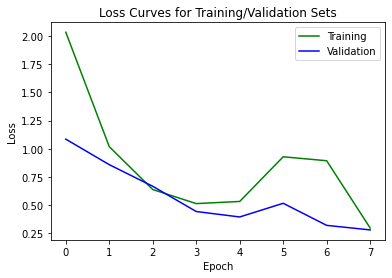

In [47]:
plot_loss_curves(history1, 'trial_1_with_5_tiles')

In [53]:
decoded_imgs1 = autoencoder1.predict(sources_test_all)

In [27]:
def plot_images(images, band):
    fig, axes = plt.subplots(3,3, figsize=(8,8))
    i = 0
    for row in range(3):
        for col in range(3):
            norm = ImageNormalize(images[i][:,:,band], interval=ZScaleInterval())
            axes[row][col].imshow(images[i][:,:,band], norm=norm)
            i += 1

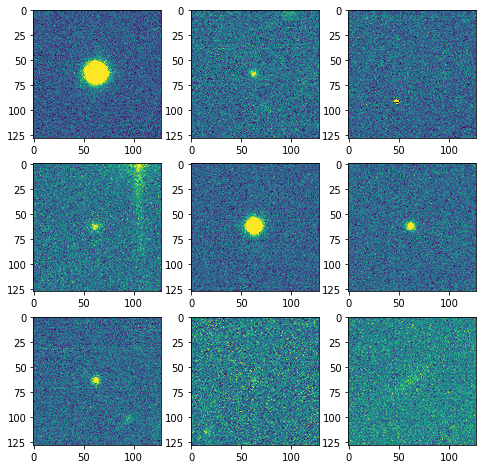

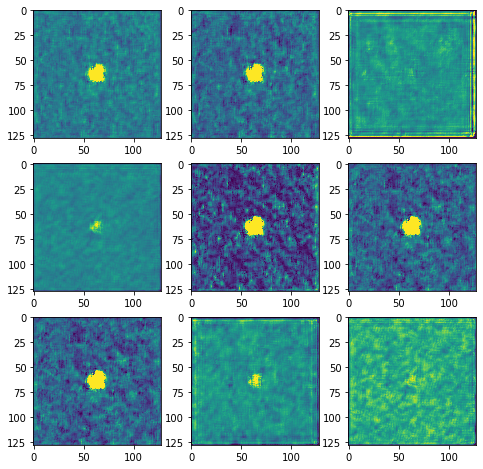

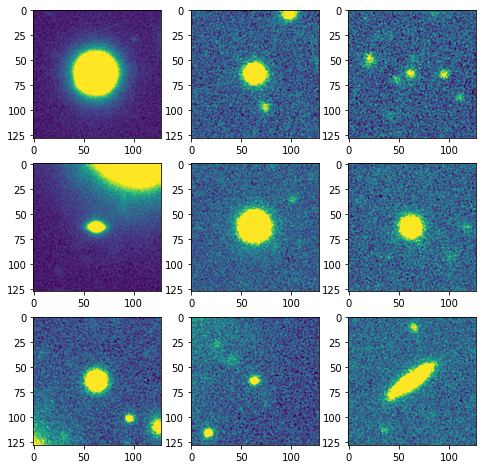

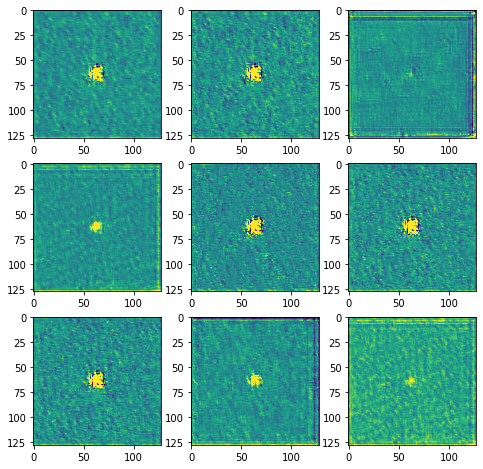

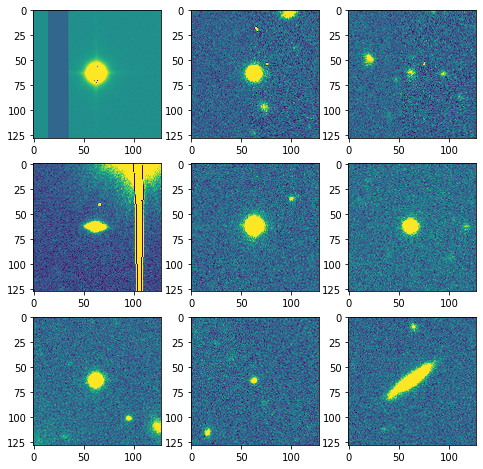

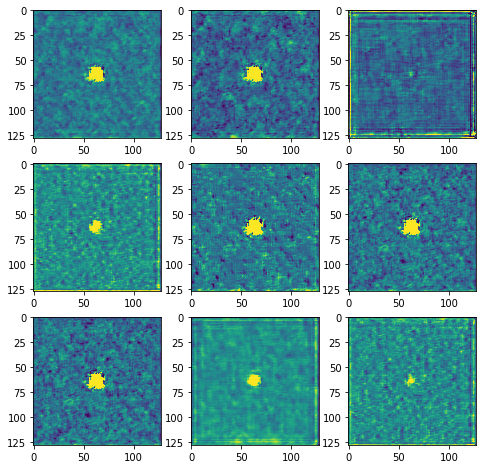

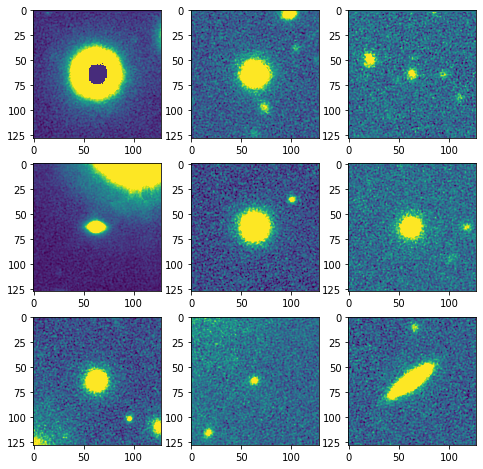

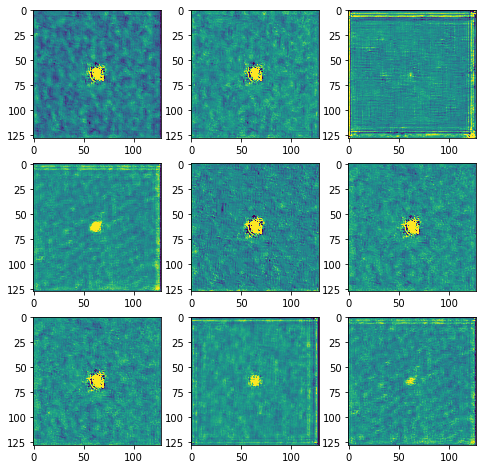

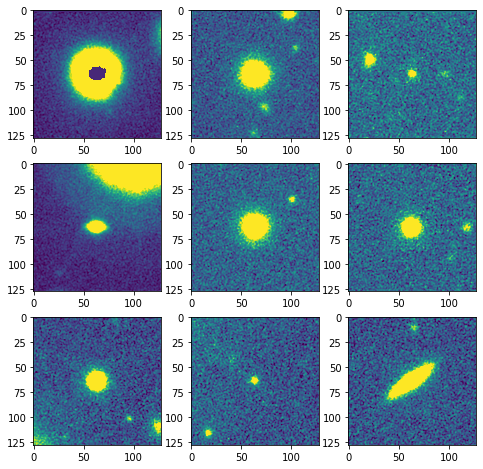

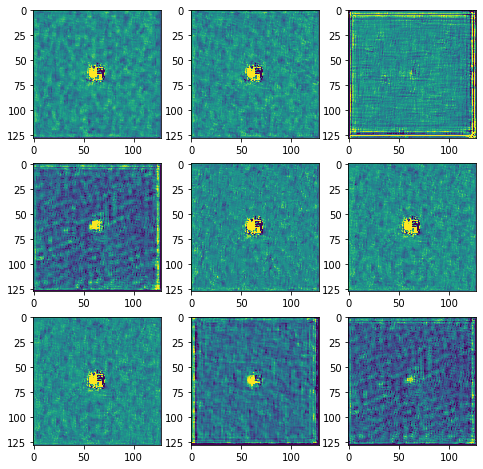

In [73]:
for i in range(5):
    plot_images(sources_test_all, i)
    plt.savefig('../Plots/trial1_5tiles_original1'+str(i))
    plot_images(decoded_imgs1,i)
    plt.savefig('../Plots/trial1_5tiles_encoded1'+str(i))

## Fully convolutional autoencoder

In [28]:
def create_autoencoder2(shape):
    input_img = keras.Input(shape=shape)
    x = keras.layers.Conv2D(16, kernel_size=3, activation='relu', padding='same')(input_img)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(x)
    x = keras.layers.BatchNormalization()(x)

    y = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(input_img)
    y = keras.layers.BatchNormalization()(y)
    encoded = keras.layers.Add()([x,y])
    
    x = keras.layers.Conv2DTranspose(32, kernel_size=4, activation='relu', padding='same')(encoded)
    x = keras.layers.Conv2DTranspose(16, kernel_size=4, activation='relu', padding='same')(x)
    decoded = keras.layers.Conv2D(shape[2], kernel_size=3, activation='linear', padding='same')(x)
    
    return keras.Model(input_img, decoded)

In [22]:
#if previously trained
autoencoder_all = keras.models.load_model("../Models/autoencoder_64p")#custom_objects={'custom_loss_all': custom_loss_all})
hist_csv_file = '../Histories/history_64p.csv'

# Train on all filters

In [29]:
autoencoder_all = create_autoencoder2((CUTOUT_SIZE, CUTOUT_SIZE, 5))
autoencoder_all.compile(optimizer='adam', loss='mean_squared_error')

In [30]:
autoencoder_all.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 5) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 16) 736         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 32) 4640        batch_normalization[0][0]        
_______________________________________________________________________________________

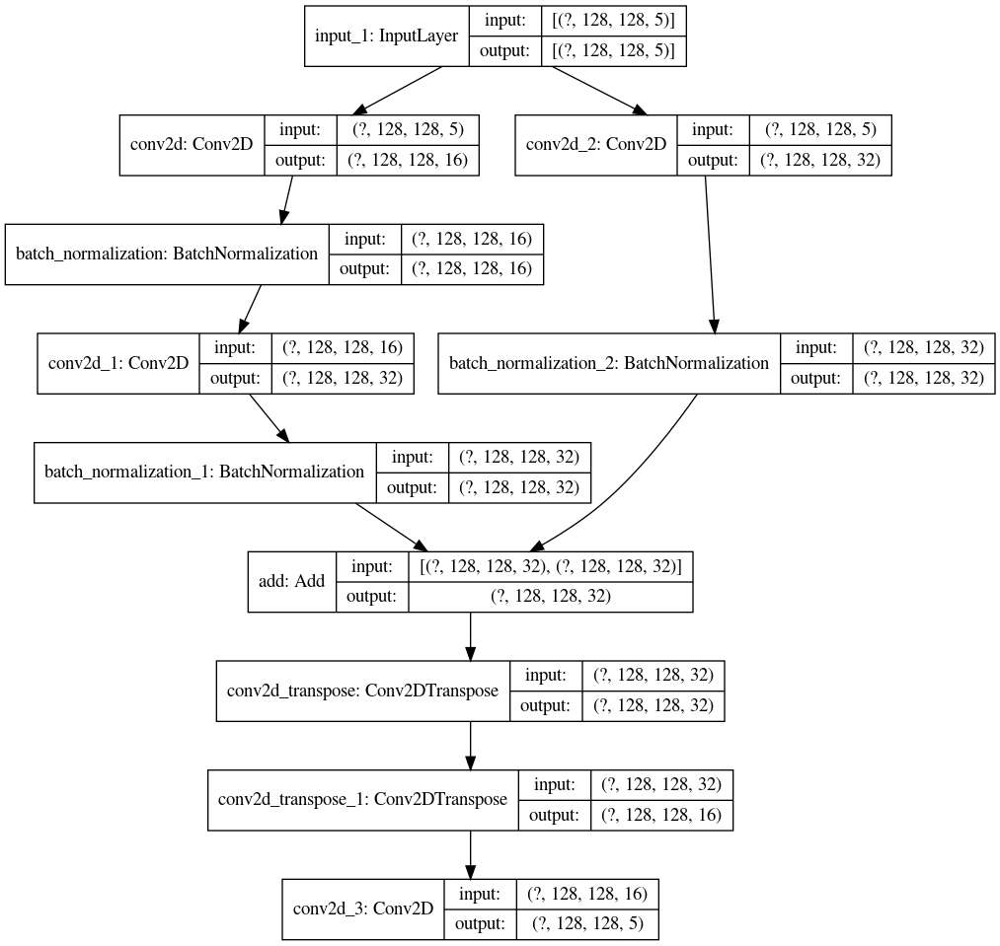

In [31]:
keras.utils.plot_model(autoencoder_all, to_file='../Models/autoencoder_64p_plot.png', show_shapes=True, show_layer_names=True)

In [32]:
(autoencoder_all, history_all) = train_autoencoder(autoencoder_all, train_indices, val_indices, N_EPOCHS,
                                                   BATCH_SIZE, CUTOUT_SIZE)
autoencoder_all.save("../Models/autoencoder_64p")
hist_df = pd.DataFrame(history_all.history) 

hist_csv_file = '../Histories/history_64p.csv'
with open(hist_csv_file, mode='a') as f:
    hist_df.to_csv(f)

Epoch 1/8
112/112 [==============================] - 2167s 19s/step - loss: 1.9884 - val_loss: 0.5717
Epoch 2/8
112/112 [==============================] - 612s 5s/step - loss: 1.0735 - val_loss: 0.2470
Epoch 3/8
112/112 [==============================] - 699s 6s/step - loss: 0.6397 - val_loss: 0.1864
Epoch 4/8
112/112 [==============================] - 587s 5s/step - loss: 0.4322 - val_loss: 0.1462
Epoch 5/8
112/112 [==============================] - 592s 5s/step - loss: 0.3638 - val_loss: 0.1222
Epoch 6/8
112/112 [==============================] - 584s 5s/step - loss: 0.2949 - val_loss: 0.1001
Epoch 7/8
112/112 [==============================] - 626s 6s/step - loss: 0.2432 - val_loss: 0.0968
Epoch 8/8
112/112 [==============================] - 576s 5s/step - loss: 0.2468 - val_loss: 0.1019
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as

In [24]:
def plot_loss_curves(history, figname):
    plt.plot(history["loss"], color="g", label="Training")
    plt.plot(history["val_loss"], color="b", label="Validation")
    plt.title("Loss Curves for Training/Validation Sets")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("../Loss Curves/" + figname)

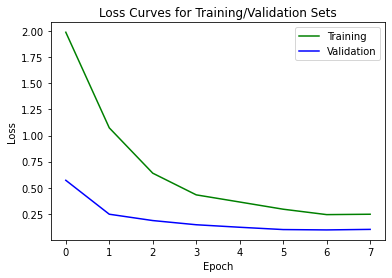

In [25]:
history_all = pd.read_csv(hist_csv_file)
plot_loss_curves(history_all, figname="trial1_a2_FiveTrainingTiles64p_copy.png")

## Testing 2nd autoencoder

In [57]:
decoded_imgs_all = autoencoder_all.predict(sources_test_all)
residuals_all = sources_test_all - decoded_imgs_all

In [27]:
imgs_all = np.zeros((3, *sources_test_all.shape))
imgs_all[0] = sources_test_all
imgs_all[1] = decoded_imgs_all
imgs_all[2] = residuals_all
imgs_all.shape

(3, 50, 128, 128, 5)

In [66]:
def plot_images(images, figname, bands, start=0):
    #plots source, reconstructed and residuals for 1 image (start = index) for all bands
    fig, axes = plt.subplots(images.shape[0],len(bands), figsize=(14,8))
    fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.45)
    for row in range(images.shape[0]):
        for col in range(len(bands)):
            norm = ImageNormalize(images[row, start,:,:,col], interval=ZScaleInterval())
            im = axes[row][col].imshow(images[row, start,:,:,col], norm=norm)
            fig.colorbar(im, fraction=0.045, ax=axes[row][col])
            if row == 0:
                axes[row][col].set_title(bands[col])
    plt.savefig("../Plots/" + figname)

In [67]:
tile_ids[test_index]

'185.270'

In [68]:
bands=["CFIS u", "PS1 g", "CFIS r", "PS1 i", "PS1 z"]

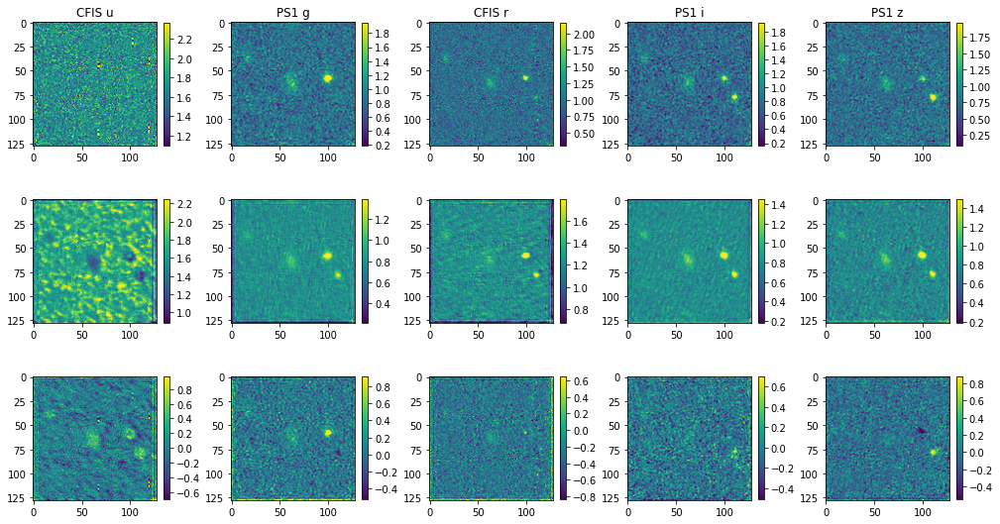

In [70]:
plot_images(imgs_all, "Cutouts 185.270 c12 64p colorbar.png", bands=bands, start=15)

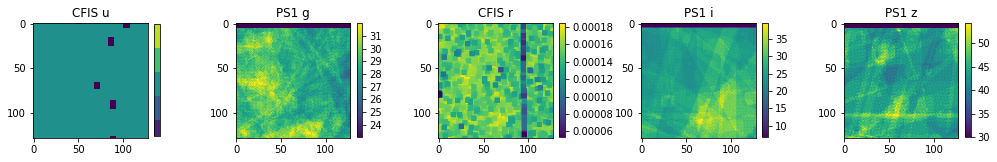

In [32]:
fig, axes = plt.subplots(1,5, figsize=(14,8))
fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.6)
start = 14
for i in range(5):
    norm = ImageNormalize(weights_test_all[start,:,:,i], interval=ZScaleInterval())
    im = axes[i].imshow(weights_test_all[start,:,:,i], norm=norm)
    fig.colorbar(im, fraction=0.045, ax=axes[i])
    axes[i].set_title(bands[i])
#plt.savefig(f"../Plots/Weights 185.270 c{start} 64p.png")

In [50]:
weights_test_all[6,:,:,0]

array([[0.00169564, 0.00169564, 0.00169564, ..., 0.00169564, 0.00169564,
        0.00169564],
       [0.00169564, 0.00169564, 0.00169564, ..., 0.00169564, 0.00169564,
        0.00169564],
       [0.00169564, 0.00169564, 0.00169564, ..., 0.00169564, 0.00169564,
        0.00169564],
       ...,
       [0.00169564, 0.00169564, 0.00169564, ..., 0.00169564, 0.00169564,
        0.00169564],
       [0.00169564, 0.00169564, 0.00169564, ..., 0.00169564, 0.00169564,
        0.00169564],
       [0.00169564, 0.00169564, 0.00169564, ..., 0.00169564, 0.00169564,
        0.00169564]])

In [33]:
decoded_imgs_all.shape

(50, 128, 128, 5)

# Plotting all (50) test images, reconstructions and residuals

In [77]:
def plot_mosaic(images, figname): 
    #plotting 50 images, 5 bands
    fig, axes = plt.subplots(50,len(bands), figsize=(5,50))
    #fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.45)
    i=0
    for row in range(50):
        for col in range(len(bands)):
            norm = ImageNormalize(images[row,:,:,col], interval=ZScaleInterval())
            im = axes[row][col].imshow(images[row,:,:,col], norm=norm)
            #fig.colorbar(im, fraction=0.045, ax=axes[row][col])
            axes[row][col].set_yticks([]);axes[row][col].set_xticks([])
            if row == 0:
                axes[row][col].set_title(bands[col])
            i += 1
    plt.savefig("../Plots/" + figname)

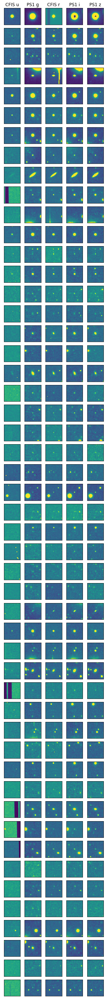

In [78]:
plot_mosaic(sources_test_all, 'sources_images_all')

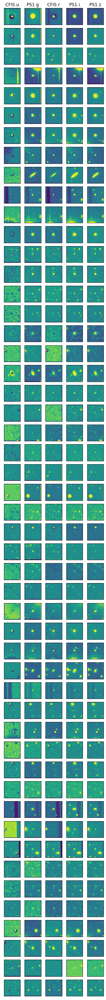

In [79]:
plot_mosaic(decoded_imgs_all, 'decoded_images_all')

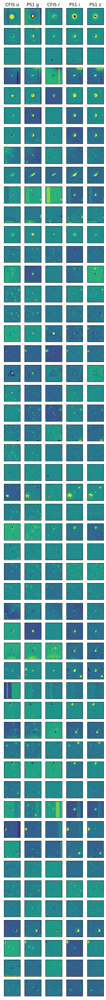

In [80]:
plot_mosaic(residuals_all, 'residuals_all')

In [81]:
def min_max_pixels(images, bands, start=0):
    for i in range(len(bands)):
        print(bands[i])
        print("Min pixel value: " + str(np.min(images[start,:,:,i])))
        print("Max pixel value: " + str(np.max(images[start,:,:,i])))
        print()

In [82]:
min_max_pixels(sources_test_all, bands=bands, start=5)

CFIS u
Min pixel value: 0.0
Max pixel value: 3.139971971511841

PS1 g
Min pixel value: 0.0
Max pixel value: 13.585445404052734

CFIS r
Min pixel value: 0.0
Max pixel value: 77.27584075927734

PS1 i
Min pixel value: 0.0
Max pixel value: 21.349979400634766

PS1 z
Min pixel value: 0.0
Max pixel value: 22.422582626342773



In [83]:
min_max_pixels(decoded_imgs_all, bands=bands, start=5)

CFIS u
Min pixel value: -0.97918856
Max pixel value: 13.0163355

PS1 g
Min pixel value: -0.050566792
Max pixel value: 17.61034

CFIS r
Min pixel value: -0.010038987
Max pixel value: 72.09573

PS1 i
Min pixel value: 0.056745127
Max pixel value: 19.909546

PS1 z
Min pixel value: 0.018426433
Max pixel value: 24.050175



In [84]:
min_max_pixels(residuals_all, bands=bands, start=5)

CFIS u
Min pixel value: -10.362400531768799
Max pixel value: 2.63502836227417

PS1 g
Min pixel value: -5.219818115234375
Max pixel value: 5.6150803565979

CFIS r
Min pixel value: -3.761496067047119
Max pixel value: 7.481996536254883

PS1 i
Min pixel value: -2.187427520751953
Max pixel value: 5.139809608459473

PS1 z
Min pixel value: -3.1425037384033203
Max pixel value: 5.022590637207031



In [85]:
def plot_hist(images, wts, figname, bands, start=0):
    fig, axes = plt.subplots(images.shape[0],len(bands), figsize=(20,8))
    for row in range(images.shape[0]):
        for col in range(len(bands)):
            mean = np.mean(images[row,start,:,:,col])
            std = np.std(images[row,start,:,:,col])
            if row == 2:
                x = images[0,start,:,:,col]
                xr = images[1,start,:,:,col]
                axes[row][col].hist((np.sqrt(wts[start,:,:,col])*(x-xr)).ravel())
            else:
                axes[row][col].hist(images[row,start,:,:,col].ravel())
            axes[row][col].set_ylim(top=4000)
            #xlim = axes[row][col].get_xlim()[1]
            #ylim = axes[row][col].get_ylim()[1]
            #axes[row][col].annotate(r"$\mu={:.4f}$".format(mean), (0.7*xlim, 0.7*ylim))
            #axes[row][col].annotate(r"$\sigma={:.4f}$".format(std), (0.7*xlim, 0.6*ylim))
            if row == 0:
                axes[row][col].set_title(bands[col])
    plt.savefig("../Histograms/" + figname)

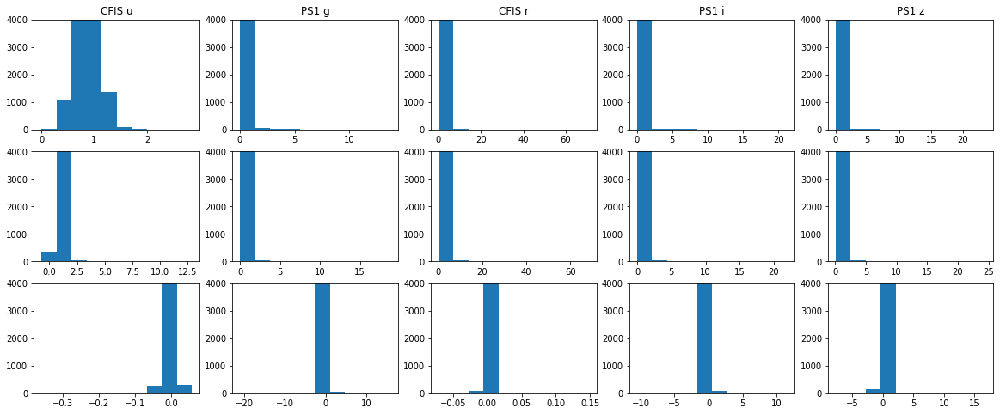

In [87]:
plot_hist(imgs_all, weights_test_all, "Cutouts 185.270 c46 64p weight_res.png", bands=bands, start=46)

# Train on CFIS filters (u,r)


In [91]:
def create_autoencoder2(shape):
    input_img = keras.Input(shape=shape)
    x = keras.layers.Conv2D(16, kernel_size=3, activation='relu', padding='same')(input_img)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(x)
    x = keras.layers.BatchNormalization()(x)

    y = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(input_img)
    y = keras.layers.BatchNormalization()(y)
    encoded = keras.layers.Add()([x,y])
    
    x = keras.layers.Conv2DTranspose(32, kernel_size=4, activation='relu', padding='same')(encoded)
    x = keras.layers.Conv2DTranspose(16, kernel_size=4, activation='relu', padding='same')(x)
    decoded = keras.layers.Conv2D(shape[2], kernel_size=3, activation='linear', padding='same')(x)
    
    return keras.Model(input_img, decoded)

In [93]:
autoencoder_cfis = create_autoencoder2((CUTOUT_SIZE, CUTOUT_SIZE, 2))
autoencoder_cfis.compile(optimizer="adam", loss=custom_loss_cfis)

In [94]:
autoencoder_cfis.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 2) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 16) 304         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 128, 128, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 32) 4640        batch_normalization[0][0]        
_______________________________________________________________________________________

In [ ]:
(autoencoder_cfis, history_cfis) = train_autoencoder(autoencoder_cfis, train_indices, 
                                                     val_indices, batch_size=BATCH_SIZE, cutout_size=CUTOUT_SIZE, n_epochs= N_EPOCHS, bands="cfis")

Epoch 1/8
112/112 [==============================] - ETA: 0s - loss: 0.0083

In [ ]:
plot_loss_curves(history_cfis, figname="TenTrainingTilesCFIS.png")

In [ ]:
decoded_imgs_cfis = autoencoder_cfis.predict(sources_test_cfis)
residuals_cfis = sources_test_cfis - decoded_imgs_cfis

In [ ]:
plot_images(sources_test_cfis, "Test Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
plot_images(decoded_imgs_cfis, "Reconstructed Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
plot_images(residuals_cfis, "Residual Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
min_max_pixels(sources_test_cfis, bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
min_max_pixels(decoded_imgs_cfis, bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
min_max_pixels(residuals_cfis, bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
plot_hist(sources_test_cfis, "Test Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

In [ ]:
plot_hist(decoded_imgs_cfis, "Reconstructed Cutouts 185.270 CFIS.png", bands=["CFIS u", "PS1 r"], start=2)

In [ ]:
plot_hist(residuals_cfis, "Residual Cutouts 185.270 CFIS.png", bands=["CFIS u", "CFIS r"], start=2)

# Train on PS1 filters (i,g,z)

In [ ]:
autoencoder_ps1 = create_autoencoder2((cutout_size, cutout_size, 3))
autoencoder_ps1.compile(optimizer="adam", loss=custom_loss_ps1)

In [ ]:
autoencoder_ps1.summary()

In [ ]:
(autoencoder_ps1, history_ps1) = train_autoencoder(autoencoder_ps1, train_indices, 
                                                     val_indices, batch_size, cutout_size, bands="ps1")

In [ ]:
plot_loss_curves(history_ps1, figname="TenTrainingTilesPS1.png")

In [ ]:
decoded_imgs_ps1 = autoencoder_ps1.predict(sources_test_ps1)
residuals_ps1 = sources_test_ps1 - decoded_imgs_ps1

In [ ]:
plot_images(sources_test_ps1, "Test Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
plot_images(decoded_imgs_ps1, "Reconstructed Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
plot_images(residuals_ps1, "Residual Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
min_max_pixels(sources_test_ps1, bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
min_max_pixels(decoded_imgs_ps1, bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
min_max_pixels(residuals_ps1, bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
plot_hist(sources_test_ps1, "Test Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
plot_hist(decoded_imgs_ps1, "Reconstructed Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [ ]:
plot_hist(residuals_ps1, "Residual Cutouts 185.270 PS1.png", bands=["PS1 g", "PS1 i", "PS1 z"], start=5)

In [80]:
hf.close()